# i. Introduction

---

**Creator  : Serina Roihaanah Mulawati**  


Program ini dibuat untuk memprediksi apakah suatu gambar merupakan gambar mobil atau motor untuk membantu Otoritas Pengelola Lalu Lintas dan Keamanan Jalan.

---


# ii. Problem Background

### ii. a. Prologue

Program ini dirancang untuk membantu Otoritas Pengelola Lalu Lintas dan Keamanan Jalan dalam mengembangkan sistem klasifikasi otomatis untuk mengidentifikasi jenis kendaraan berdasarkan gambar. Model ini akan mengklasifikasikan gambar kendaraan ke dalam dua kategori: `mobil` dan `motor`. Dengan menggunakan dataset yang tersedia pada [Kaggle](https://www.kaggle.com/datasets/utkarshsaxenadn/car-vs-bike-classification-dataset/data), program ini akan mengidentifikasi faktor-faktor visual yang dapat memisahkan kedua jenis kendaraan ini.

### ii. b. Business Understanding

Untuk merancang proyek ini, maka dirancang **SMART Framework** dengan rincian sebagai berikut:

- **SPECIFIC**:  
  Fokus dari proyek ini adalah mengembangkan model klasifikasi yang dapat secara otomatis membedakan antara gambar mobil dan motor.

- **MEASURABLE**:  
  Model yang berhasil harus mampu mencapai akurasi klasifikasi minimal 70% pada data pengujian untuk memastikan tingkat identifikasi yang dapat diterima.

- **ACHIEVABLE**:  
  Model dapat mengidentifikasi faktor-faktor visual yang dapat memisahkan kedua jenis kendaraan.

- **RELEVANT**:  
  Identifikasi kendaraan yang akurat merupakan suatu hal yang penting dalam meningkatkan efisiensi dan keamanan lalu lintas. Proyek ini akan memberikan dukungan bagi otoritas transportasi dalam pemantauan kendaraan secara otomatis.

- **TIME-BOUND**:  
  Proyek ini direncanakan untuk diselesaikan dalam waktu tiga bulan, termasuk pelatihan model, evaluasi, dan penerapan hasilnya.

**PROBLEM STATEMENT**  
Target yang ingin dicapai adalah meningkatkan kemampuan pemantauan dan pengelolaan kendaraan melalui sistem klasifikasi otomatis untuk membedakan jenis kendaraan. Dengan klasifikasi yang cepat dan akurat, pengelola lalu lintas dapat mengoptimalkan arus kendaraan dan memperkuat pengawasan lalu lintas secara keseluruhan.

**Objective:**  
Proyek ini bertujuan untuk mendukung otoritas lalu lintas dalam mengembangkan sistem pemantauan berbasis AI yang dapat mengidentifikasi jenis kendaraan dari gambar dengan akurat dan cepat. Model ini akan menjadi dasar untuk mengembangkan strategi manajemen lalu lintas yang lebih efisien dan mendukung kebijakan keselamatan jalan yang lebih efektif.

### ii. c. Breaking Down the Problem

**Masalah utama:** `Mengklasifikasikan gambar kendaraan untuk mendukung sistem pengelolaan lalu lintas yang otomatis dan lebih efisien`

Untuk memudahkan analisis dan menyelesaikan masalah, kita perlu memahami detail tentang masalah tersebut.

- Apakah terdapat pola visual atau karakteristik tertentu yang memungkinkan model membedakan antara **mobil** dan **motor** dengan tingkat akurasi yang tinggi?

- Apa rekomendasi bisnis yang dapat diberikan kepada otoritas lalu lintas berdasarkan hasil analisis ini untuk meningkatkan efisiensi dan keamanan di jalan raya?

- Bagaimana dampak dari pengklasifikasian kendaraan ini terhadap strategi manajemen lalu lintas, seperti pengaturan arus kendaraan dan peningkatan keamanan?

# iii. Import Libraries

Bagian ini berfungsi untuk menyimpan library yang akan digunakan dalam mengeksekusi sintaks.

In [1]:
# Downgrade version of TensorFlow and tf-keras

!pip install -q --upgrade "tensorflow<2.16" "tf-keras<2.16"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 46.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 50.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 86.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.0 MB/s eta 0:00:00


In [2]:
# System and file handling
import os                       # For interacting with the operating system
import cv2                      # OpenCV for image processing
import glob                     # For file pattern matching
import random                   # To generate random numbers
import numpy as np              # Array manipulation and numerical operations
import pandas as pd             # Data manipulation and analysis
import seaborn as sns           # Statistical data visualization
import matplotlib.pyplot as plt # Plotting graphs
import matplotlib.image as mpimg # Displaying images

# TensorFlow and Keras for deep learning
import tensorflow as tf                                     # Core TensorFlow functionalities
from tensorflow.keras.preprocessing import image            # For loading and preprocessing images
from tensorflow.keras import layers                         # For defining neural network layers
from tensorflow.keras.models import Model, Sequential       # Model building frameworks
from tensorflow.keras.preprocessing.image import ImageDataGenerator # For image augmentation
from tensorflow.keras.callbacks import EarlyStopping        # Early stopping to prevent overfitting
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input, GlobalAveragePooling2D, BatchNormalization # Layer types
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau # Callback functions to improve training
from keras.applications.vgg16 import VGG16, preprocess_input # VGG16 model and preprocessing for transfer learning

# Scikit-learn for model evaluation
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay # Metrics for model evaluation
from sklearn.model_selection import train_test_split              # Splitting data into train/test sets

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')        # Ignores unwanted warnings

# Additional libraries for Google Colab and image handling
from google.colab import files           # To upload files in Google Colab
from PIL import Image                    # For opening and manipulating images

# Display TensorFlow version
print(tf.__version__)                    # Prints the TensorFlow version


2.15.1


# iv. Data Loading

Bagian ini berfungsi untuk melakukan loading dataset. Data akan diambil melalui kaggle dengan sumber pada [link berikut](https://www.kaggle.com/datasets/utkarshsaxenadn/car-vs-bike-classification-dataset/code).

In [3]:
# upload file
files.upload()

# Move to folder .kaggle
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/

Saving kaggle.json to kaggle.json


In [4]:
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
%%time
# Download Dataset
# Source dataset : https://www.kaggle.com/datasets/utkarshsaxenadn/car-vs-bike-classification-dataset/code

!kaggle datasets download utkarshsaxenadn/car-vs-bike-classification-dataset
!unzip -qq /content/car-vs-bike-classification-dataset.zip

Dataset URL: https://www.kaggle.com/datasets/utkarshsaxenadn/car-vs-bike-classification-dataset
License(s): CC0-1.0
 97% 100M/103M [00:06<00:00, 17.2MB/s] 
100% 103M/103M [00:06<00:00, 16.3MB/s]
CPU times: user 93.8 ms, sys: 12.9 ms, total: 107 ms
Wall time: 10.9 s


In [6]:
# Renaming filenames of each category

car_files = glob.glob('/content/Car-Bike-Dataset/Car/*')
num = 1
for cf in car_files:
  os.rename(cf, '/content/Car-Bike-Dataset/Car/car_' + "{:03d}".format(num) + '.jpg')
  num += 1

bike_files = glob.glob('/content/Car-Bike-Dataset/Bike/*')
num = 1
for df in bike_files:
  os.rename(df, '/content/Car-Bike-Dataset/Bike/bike_' + "{:03d}".format(num) + '.jpg')
  num += 1

In [7]:
# Listing images of each category

car_files = glob.glob('/content/Car-Bike-Dataset/Car/*')
bike_files = glob.glob('/content/Car-Bike-Dataset/Bike/*')

car_files.sort()
bike_files.sort()

print('car_files : ', car_files)
print('')
print('bike_files : ', bike_files)

car_files :  ['/content/Car-Bike-Dataset/Car/car_001.jpg', '/content/Car-Bike-Dataset/Car/car_002.jpg', '/content/Car-Bike-Dataset/Car/car_003.jpg', '/content/Car-Bike-Dataset/Car/car_004.jpg', '/content/Car-Bike-Dataset/Car/car_005.jpg', '/content/Car-Bike-Dataset/Car/car_006.jpg', '/content/Car-Bike-Dataset/Car/car_007.jpg', '/content/Car-Bike-Dataset/Car/car_008.jpg', '/content/Car-Bike-Dataset/Car/car_009.jpg', '/content/Car-Bike-Dataset/Car/car_010.jpg', '/content/Car-Bike-Dataset/Car/car_011.jpg', '/content/Car-Bike-Dataset/Car/car_012.jpg', '/content/Car-Bike-Dataset/Car/car_013.jpg', '/content/Car-Bike-Dataset/Car/car_014.jpg', '/content/Car-Bike-Dataset/Car/car_015.jpg', '/content/Car-Bike-Dataset/Car/car_016.jpg', '/content/Car-Bike-Dataset/Car/car_017.jpg', '/content/Car-Bike-Dataset/Car/car_018.jpg', '/content/Car-Bike-Dataset/Car/car_019.jpg', '/content/Car-Bike-Dataset/Car/car_020.jpg', '/content/Car-Bike-Dataset/Car/car_021.jpg', '/content/Car-Bike-Dataset/Car/car_022.jp

In [8]:
# Create a Pandas DataFrame that contains the path of all images

all_files = car_files + bike_files
labels = ['cars' for i in range(len(car_files))] + ['bikes' for i in range(len(bike_files))]
img_df = pd.DataFrame({'images':all_files, 'label':labels})
img_df = img_df.sample(len(img_df)).reset_index(drop=True)
img_df

,images,label
0,/content/Car-Bike-Dataset/Bike/bike_1747.jpg,bikes
1,/content/Car-Bike-Dataset/Car/car_610.jpg,cars
2,/content/Car-Bike-Dataset/Bike/bike_213.jpg,bikes
3,/content/Car-Bike-Dataset/Bike/bike_1736.jpg,bikes
4,/content/Car-Bike-Dataset/Car/car_123.jpg,cars
...,...,...
3995,/content/Car-Bike-Dataset/Bike/bike_795.jpg,bikes
3996,/content/Car-Bike-Dataset/Bike/bike_972.jpg,bikes
3997,/content/Car-Bike-Dataset/Bike/bike_983.jpg,bikes
3998,/content/Car-Bike-Dataset/Bike/bike_1857.jpg,bikes


Path gambar telah dibentuk ke dalam dataframe dengan jumlah data sebanyak 4000.

# v. Exploratory Data Analysis (EDA)

Bagian ini berfungsi untuk mencari tahu bagaimana karakteristik dari dataset yang tersedia.

## v.a. Data Distribution

Pada bagian ini kita akan melihat bagaimana distribusi dari dataset.

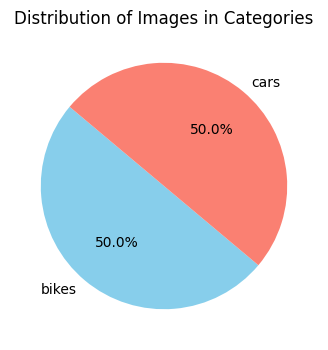

In [35]:
label_counts = img_df['label'].value_counts()

# Make Pie Chart
plt.figure(figsize=(4, 4))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'salmon'])
plt.title('Distribution of Images in Categories')
plt.show()

Dalam data ini tersedia 2 kelas data yaitu bikes dan cars. Terlihat bahwa data memiliki jumlah yang sama di kedua kelas tersebut.

Berikut adalah gambar yang tersedia dalam kelas car.

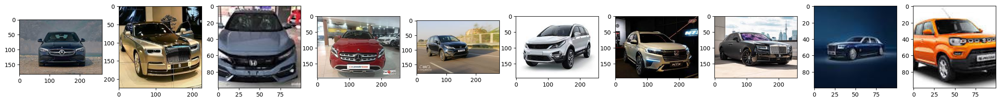

In [36]:
# Show Car images

fig, ax = plt.subplots(ncols=10, figsize=(30,5))
for i in range(10):
  car = plt.imread(car_files[i])
  ax[i].imshow(car)

Berikut adalah gambar yang tersedia dalam kelas bikes

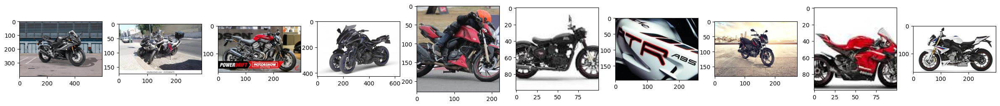

In [37]:
# Show Bike images

fig, ax = plt.subplots(ncols=10, figsize=(30,3))
for i in range(10):
  bike = plt.imread(bike_files[i])
  ax[i].imshow(bike)

Selanjutnya kita coba lihat bagainaman pixel serta dimensi gambar pertama dalam dataframe tersebut.

In [38]:
# First image
image_path = img_df['images'][0] # path of first image in df
image = Image.open(image_path) #
image_array = np.array(image)

# Show pixel
print('Images : ', image_array)
print('Shape  : ', image_array.shape)

Images :  [[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[255 254 252]
  [254 255 250]
  [254 255 249]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[254 254 254]
  [254 254 254]
  [254 254 254]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]]
Shape  :  (211, 239, 3)


Dalam gambar pertama di dataframe ini memiliki tinggi 211 pixel, lebar 239 pixel, dan memilki 3 channel warna yaitu RGB (Red, Green, Blue).

Selanjutnya kita beri indeks pada kategori unik dalam label dataset.

In [9]:
# Unique Category
categories = img_df['label'].unique()

# Index Category
class_indices = {category: index for index, category in enumerate(categories)}

# Show Category
print('Index of categories:', class_indices)

Index of categories: {'bikes': 0, 'cars': 1}


## v.b. Image Color and Shape


Pada bagian ini kita akan melihat bagaimana warna dari gambar dalam dataset.

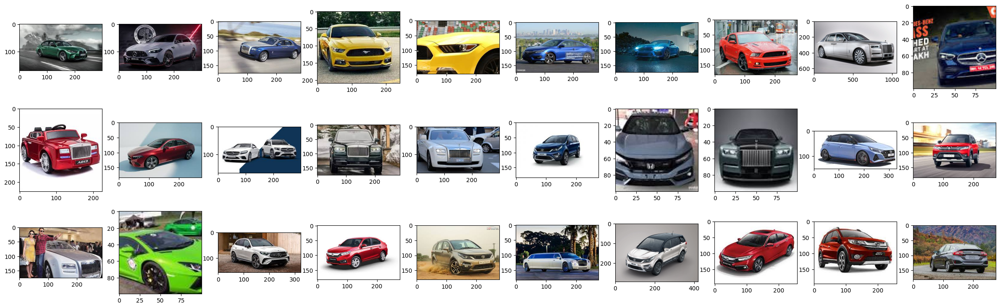

In [39]:
# Show Car images
random_car_files = random.sample(car_files, 30)
fig, ax = plt.subplots(nrows=3, ncols=10, figsize=(30,9))
ax = ax.ravel()

for i in range(30):
  car = plt.imread(random_car_files[i])
  ax[i].imshow(car)

Dalam dataset ini yang di sampling secara random, untuk kategori cars, terlihat bahwa gambar yang tersedia memiliki warna mobil yang beragam. Pada gambar yang tertampil, nampak bahwa mobil-mobil di dominasi oleh warna biru, hitam, merah, dan putih. Hal ini dapat memungkinkan terjadinya kesalahan prediksi untuk kendaraan dengan warna yang tidak biasa.

Kemudian kita lihat bagaimana karakter warna untuk gambar dengan kelas bikes.

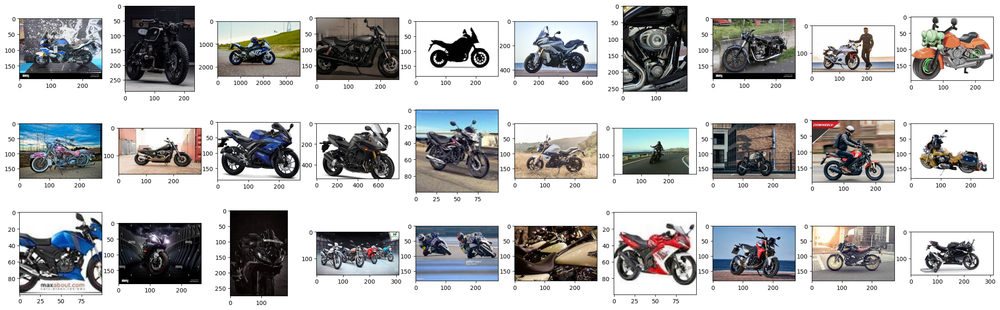

In [40]:
# Show Bike images
random_bike_files = random.sample(bike_files, 30)
fig, ax = plt.subplots(nrows=3, ncols=10, figsize=(30,9))
ax = ax.ravel()

for i in range(30):
  bike = plt.imread(random_bike_files[i])
  ax[i].imshow(bike)

Secara visual dapat dilihat bahwa gambar motor yang tersedia memiliki dominasi warna hitam.

## v.c. Image Size

Pada bagian ini kita akan melihat bagaimana ukuran dari gambar dalam dataset.

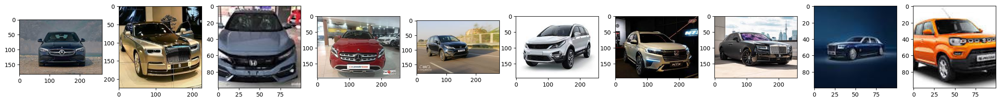

In [41]:
# Show Car images

fig, ax = plt.subplots(ncols=10, figsize=(30,3))
for i in range(10):
  car = plt.imread(car_files[i])
  ax[i].imshow(car)

Secara visual, terlihat bahwa gambar-gambar yang tertampil memiliki ukuran yang berbeda. Seperti pada gambar ke-1 memiliki ukuran lebar sekitar 300 pixel dan tinggi sekitar 180 pixel sedangkan gambar ke-2 memiliki ukuran lebar sekitar 200 pixel dan tinggi sekitar 250 pixel.

Sekarang, mari kita lihat bagaimana ukuran dari setiap gambar.

In [42]:
# Display the width and height of each car image

image_sizes = []

for file in car_files:
    with Image.open(file) as img:
        width, height = img.size
        image_sizes.append({'file_path': file, 'width': width, 'height': height})

# Make dataframe
size_car = pd.DataFrame(image_sizes)
size_car

,file_path,width,height
0,/content/Car-Bike-Dataset/Car/car_001.jpg,275,183
1,/content/Car-Bike-Dataset/Car/car_002.jpg,225,224
2,/content/Car-Bike-Dataset/Car/car_003.jpg,100,100
3,/content/Car-Bike-Dataset/Car/car_004.jpg,259,194
4,/content/Car-Bike-Dataset/Car/car_005.jpg,279,180
...,...,...,...
1995,/content/Car-Bike-Dataset/Car/car_995.jpg,310,162
1996,/content/Car-Bike-Dataset/Car/car_996.jpg,275,183
1997,/content/Car-Bike-Dataset/Car/car_997.jpg,219,231
1998,/content/Car-Bike-Dataset/Car/car_998.jpg,100,100


Terbukti bahwa setiap gambar memiliki ukuran lebar dan tinggi yang bervariasi. Untuk keperluan modelling, kita perlu mendefinisikan tinggi dan lebar dari gambar. Sebelum itu, kita akan analisa berapa ukuran yang paling banyak dari gambar-gambar mobil ini.

In [44]:
most_common_width = size_car['width'].mode()[0]
most_common_height = size_car['height'].mode()[0]

print(f"Most common width: {most_common_width}")
print(f"Most common height: {most_common_height}")

Most common width: 275
Most common height: 183


Terlihat bahwa pada kelas mobil memiliki gambar paling banyak dengan pixel 275 dan 183. Sekarang kita lihat bagaimana statistik deskriptifnya.

In [43]:
size_car.describe()

,width,height
count,2000.000000,2000.000000
mean,288.042500,192.877000
std,282.390531,181.615729
min,100.000000,100.000000
25%,259.000000,167.000000
50%,275.000000,177.000000
75%,300.000000,186.000000
max,5695.000000,3632.000000


Gambar yang ada pada kelas mobil ternyata paling kecil ada yang berukuran tinggi 100 pixel dan ada yang berukuran lebar 100 pixel. Sedangkan gambar paling besar ada yang berukuran tinggi 5695 pixel dan ada yang berukuran lebar 3632 pixel.

Sama halnya dengan data kelas cars, data dalam kelas bikes juga memiliki ukuran yang berbeda, berikut gambarannya.

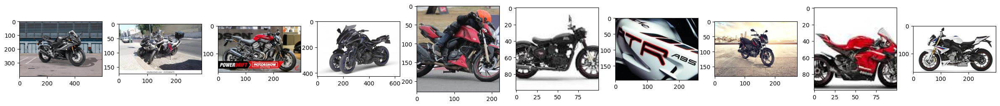

In [58]:
# Show Bike images

fig, ax = plt.subplots(ncols=10, figsize=(30,3))
for i in range(10):
  bike = plt.imread(bike_files[i])
  ax[i].imshow(bike)

Terlihat bahwa ntuk gambar pertama memiliki ukuran lebar sekitar 600 pixel dan tinggi 400 pixel.

In [59]:
# Display the width and height of each bike image

image_sizes = []

for file in bike_files:
    with Image.open(file) as img:
        width, height = img.size
        image_sizes.append({'file_path': file, 'width': width, 'height': height})

# Make dataframe
size_bike = pd.DataFrame(image_sizes)
size_bike

,file_path,width,height
0,/content/Car-Bike-Dataset/Bike/bike_001.jpg,600,400
1,/content/Car-Bike-Dataset/Bike/bike_002.jpg,289,175
2,/content/Car-Bike-Dataset/Bike/bike_003.jpg,300,168
3,/content/Car-Bike-Dataset/Bike/bike_004.jpg,640,427
4,/content/Car-Bike-Dataset/Bike/bike_005.jpg,220,229
...,...,...,...
1995,/content/Car-Bike-Dataset/Bike/bike_995.jpg,284,177
1996,/content/Car-Bike-Dataset/Bike/bike_996.jpg,480,337
1997,/content/Car-Bike-Dataset/Bike/bike_997.jpg,177,285
1998,/content/Car-Bike-Dataset/Bike/bike_998.jpg,180,132


In [60]:
most_common_widthb = size_bike['width'].mode()[0]
most_common_heightb = size_bike['height'].mode()[0]

print(f"Most common width: {most_common_widthb}")
print(f"Most common height: {most_common_heightb}")

Most common width: 275
Most common height: 183


Dapat dilihat bahwa ukuran dari gambar motor yang sering muncul sama dengan ukuran gambar mobil. Dalam gambar motor, untuk lebar di angka 275 pixel dan untuk tinggi di angka 183 pixel.

In [49]:
size_bike.describe()

,width,height
count,2000.000000,2000.000000
mean,306.851000,226.003500
std,322.356209,289.333601
min,100.000000,81.000000
25%,236.000000,168.000000
50%,275.000000,183.000000
75%,291.000000,194.000000
max,8192.000000,5840.000000


Jika dilihat dari statistik deskriptifnya, gambar yang ada pada kelas motor, ternyata gambar paling kecil memiliki ukuran tinggi 81 pixel dan ada pula yang memiliki lebar 100 pixel. Sedangkan gambar paling besar ada yang berukuran tinggi 8192 pixel dan ada yang berukuran lebar 5840 pixel.



Dengan adanya perbedaan ukuran dalam gambar-gambar di dataset ini dapat memberikan pengaruh terhadap performa dalam membangun model. Sehingga, kita perlu melakukan penyeragaman ukuran dalam tahap persiapan data dengan mendefinisikan ukuran gambar di awal tahapan. Peneliti akan menggunakan ukuran di angka 180 pixel baik untuk tinggi dan lebar dari gambar tersebut.

## v.d. Image Angle

Pada bagian ini kita akan melihat bagaimana sudut dari gambar dalam dataset.

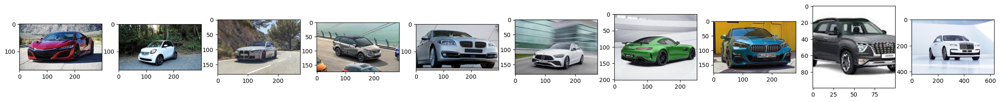

In [ ]:
# Show Car images

random_car_files = random.sample(car_files, 10)
fig, ax = plt.subplots(ncols=10, figsize=(30,3))
ax = ax.ravel()

for i in range(10):
  car = plt.imread(random_car_files[i])
  ax[i].imshow(car)

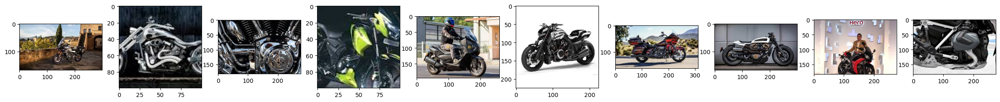

In [ ]:
# Show Bike images

random_bike_files = random.sample(bike_files, 10)
fig, ax = plt.subplots(ncols=10, figsize=(30,3))
ax = ax.ravel()

for i in range(10):
  bike = plt.imread(random_bike_files[i])
  ax[i].imshow(bike)

Dalam dataset ini, terlihat bahwa adanya keberagaman sudut dari pengambilan gambar baik sudut depan, samping, dan sedikit miring. Jika sistem klasifikasi dapat mengenali kendaraan dari berbagai sudut pandang, ini akan berguna untuk penerapan pada kamera lalu lintas yang sering menangkap kendaraan dari berbagai arah.

## v.e. Other Characteristics

Pada bagian ini kita akan melihat bagaimana karakteristik lain dari gambar dalam dataset.

### v.f.1. Image Background

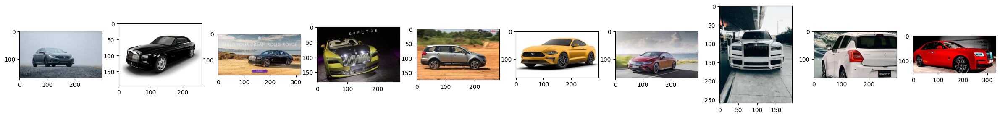

In [ ]:
# Show Car images

random_car_files = random.sample(car_files, 10)
fig, ax = plt.subplots(ncols=10, figsize=(30,3))
ax = ax.ravel()

for i in range(10):
  car = plt.imread(random_car_files[i])
  ax[i].imshow(car)

Secara visual, dapat kita lihat, pada 10 gambar mobil yang tertampil secara acak, gambar-gambar mobil ini memiliki latar belakang yang beragam. Seperti pada gambar ke-2 dan ke-6 terlihat mobil memiliki latar belakang berwarna putih sedangkan pada gambar lainnya memiliki latar belakang yang berbeda-beda. Hal ini dapat mempengaruhi hasil dan performa dari model dalam mendeteksi suatu objek.

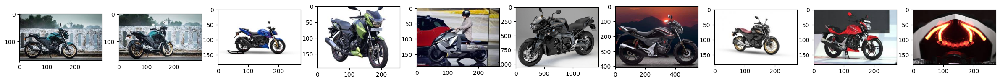

In [ ]:
# Show Bike images

random_bike_files = random.sample(bike_files, 10)
fig, ax = plt.subplots(ncols=10, figsize=(30,3))
ax = ax.ravel()

for i in range(10):
  bike = plt.imread(random_bike_files[i])
  ax[i].imshow(bike)

Sama hal nya dengan gambar mobil, gambar motor pun memiliki latar belakang yang beragam. Jika dilihat dari keseluruhan gambar dalam dataset, latar belakang pada gambar ini di dominasi dengan warna putih. Sehingga ada kecenderungan bahwa model akan sulit melakukan deteksi terhadap gambar dengan latar belakang yang berwarna atau lebih kompleks.

### v.f.2. Image Brightness

Pada bagian ini kita akan melihat bagaimana kecerahan dari gambar dalam dataset.

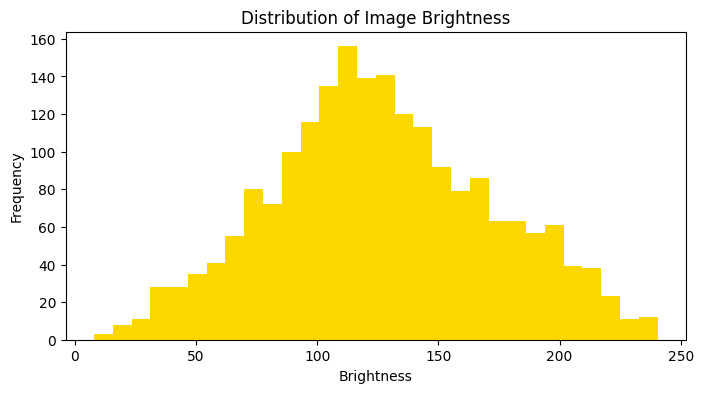

In [ ]:
# Distribution of Image Brightness

def analyze_brightness(image_path):
    image = Image.open(image_path).convert('L')  # Convert to grayscale
    brightness = np.array(image).mean()  # Calculate avg brightness
    return brightness

# Calculate brightness
img_df['brightness'] = img_df['images'].apply(analyze_brightness)

# Plot brightness distribution
plt.figure(figsize=(8, 4))
plt.hist(img_df['brightness'], bins=30, color='gold')
plt.title("Distribution of Image Brightness")
plt.xlabel("Brightness")
plt.ylabel("Frequency")
plt.show()


  Pada grafik histogram diatas, terlihat adanya distribusi yang simetris menunjukkan bahwa sebagian besar gambar memiliki kecerahan rata-rata di tengah kurva distribusi. Hal ini berarti dataset memiliki keseimbangan antara gambar yang gelap dan gambar yang terang.
  Oleh karena sebagian besar gambar memiliki kecerahan di tingkat menengah, maka dalam membangun model, akan di lakukan penyesuaian kecerahan ke dalam rentang kecerahan 80-120.

# vi. Feature Engineering

Bagian ini berfungsi dalam mempersiapkan data agar sesuai untuk membangun model.

## vi.a. Split Train, Validation, and Test

Pada bagian ini akan dilakukan pemisahan data ke dalam data train_set, val_set, dan test_set. Train_set adalah 40% dari seluruh data, sedangkan val_set sebesar 24% dan test set sebesar 16%.

In [10]:
# Split data into train_set, val_set, and test_set
train_set, temp_set = train_test_split(img_df, test_size=0.4, random_state=42, stratify=img_df['label'])
val_set, test_set = train_test_split(temp_set, test_size=0.4, random_state=42, stratify=temp_set['label'])

# Display
print("\nClass Distribution:")
print("Train Set:")
print(train_set['label'].value_counts())
print("\nValidation Set:")
print(val_set['label'].value_counts())
print("\nTest Set:")
print(test_set['label'].value_counts())


Class Distribution:
Train Set:
label
bikes    1200
cars     1200
Name: count, dtype: int64

Validation Set:
label
bikes    480
cars     480
Name: count, dtype: int64

Test Set:
label
bikes    320
cars     320
Name: count, dtype: int64


Dari 4000 data, telah terbagi ke dalam `train_set`, `val_set`, dan`test_set` dengan jumlah masing-masing sebanyak 2400 data, 960 data, dan 640 data. Pada setiap bagian akan terdapat 2 label yaitu bikes dan cars.

In [11]:
test_set

,images,label
2106,/content/Car-Bike-Dataset/Bike/bike_132.jpg,bikes
959,/content/Car-Bike-Dataset/Car/car_1961.jpg,cars
2371,/content/Car-Bike-Dataset/Car/car_1323.jpg,cars
69,/content/Car-Bike-Dataset/Car/car_1915.jpg,cars
359,/content/Car-Bike-Dataset/Bike/bike_793.jpg,bikes
...,...,...
1307,/content/Car-Bike-Dataset/Car/car_349.jpg,cars
3530,/content/Car-Bike-Dataset/Car/car_1720.jpg,cars
105,/content/Car-Bike-Dataset/Bike/bike_1876.jpg,bikes
2408,/content/Car-Bike-Dataset/Car/car_446.jpg,cars


Berikut adalah tampilan gambar untuk setiap kelasnya.

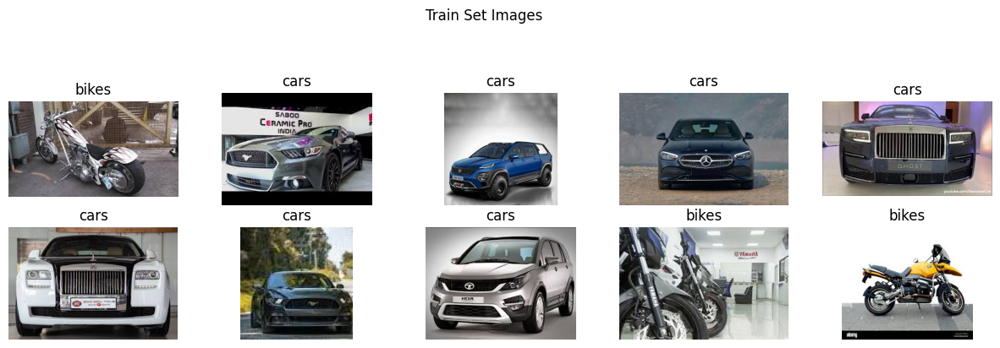

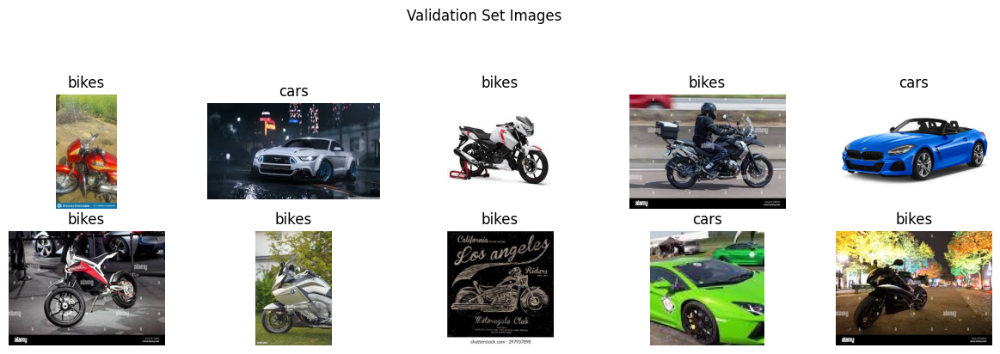

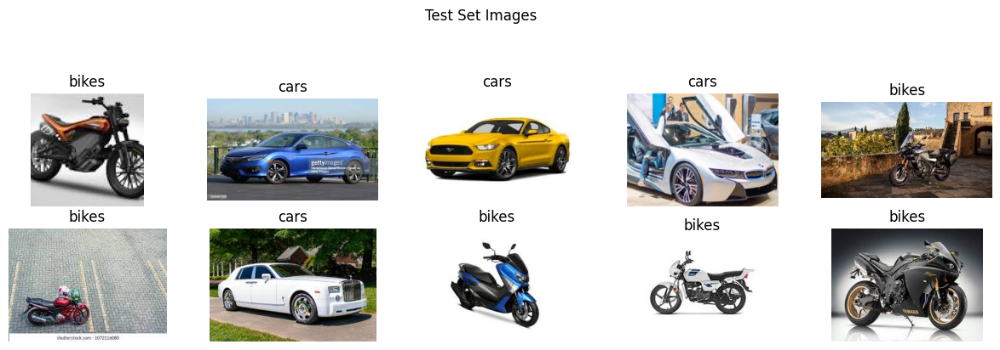

In [ ]:
# Show train_set, val_set, and test_set images
def show_images(dataframe, title):
    plt.figure(figsize=(15, 10))
    for i in range(min(len(dataframe), 10)):
        img_path = dataframe.iloc[i]['images']
        img = mpimg.imread(img_path)
        plt.subplot(5, 5, i + 1)
        plt.imshow(img)
        plt.title(dataframe.iloc[i]['label'])
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

# Show image for every set
show_images(train_set, "Train Set Images")
show_images(val_set, "Validation Set Images")
show_images(test_set, "Test Set Images")

## vi.b. Data Augmentation

Pada bagian ini akan dilakukan augmentasi pada dataset demi memberikan variasi yang lebih banyak untuk data pelatihan dengan menerapkan transformasi pada gambar seperti rotasi, zoom, flip, perubahan kecerahan, dan lainnya. Tujuan dari augmentasi data ini adalah untuk membuat model lebih tahan terhadap berbagai variasi dalam data yang baru. Penerapan augmentasi ini akan dilakukan terhadap data train_set dan val_set.

In [50]:
# Define height, width, and batch size

img_height = 180
img_width = 180
batch_size = 126

In [51]:
# Create batch generator for training, validation, and test sets

train_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(
                                                                      rescale=1./255,              # Scale pixel values to 0-1 range
                                                                      rotation_range=15,           # Rotate images between -15 to +15 degrees
                                                                      zoom_range=0.2,              # Zoom images by up to 20%
                                                                      width_shift_range=0.1,       # Shift images horizontally by up to 10% of width
                                                                      height_shift_range=0.1,      # Shift images vertically by up to 10% of height
                                                                      shear_range=0.1,             # Shear images
                                                                      horizontal_flip=True,        # Flip images horizontally
                                                                      brightness_range=[0.8, 1.2], # Adjust brightness between 80% and 120%
                                                                      fill_mode='nearest'          # Fill empty pixels after transformation
                                                                   )

# Generate augmented training set
train_set_aug = train_datagen_aug.flow_from_dataframe(
                                                      dataframe=train_set,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2
                                                     )

# Generate augmented validation set
val_set_aug = train_datagen_aug.flow_from_dataframe(
                                                      dataframe=val_set,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2
                                                     )

# Create test set generator without augmentation
test_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

test_set_aug = test_datagen_aug.flow_from_dataframe(
                                                      dataframe=test_set,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=False,
                                                      seed=2
                                                   )

Found 2400 validated image filenames belonging to 2 classes.
Found 960 validated image filenames belonging to 2 classes.
Found 640 validated image filenames belonging to 2 classes.


# vii. ANN Training (Sequential API/Functional API)

## vii.a. Model Definition

Pada bagian ini akan dilakukan pendefinisian model. Pada proyek ini, peneliti akan membangun model dengan menggunakan **Sequential API**. Model ini terdiri dari beberapa lapisan konvolusi dimana lapisan ppertama merupakan lapisan konvolusi yang didefinisikan dengan 16 filter dan diikuti dengan lapisan pooling dengan metode maxpooling untuk mengurangi dimensi spasial dari output. Pada lapisan kedua merupakan lapisan konvolusi yang memiliki 32 filter yang kemudian dilakukan pemerataan (flatten). Untuk mengurangi kemungkinan overfitting, peneliti juga akan menambahkan lapisan dropout yang diharapkan akan membantu model belajar dengan lebih baik dari data pelatihan. Lapisan output pada model ini menggunakan fungsi aktivasi sigmoid untuk karena memiliki 2 jenis kelas yaitu cars dan bikes.

In [52]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [53]:
# Create Sequential API model

model_aug = Sequential()

# Add the first convolutional layer with 16 filters and ReLU activation
model_aug.add(Conv2D(16, (3,3), activation='relu', kernel_initializer=tf.keras.initializers.HeNormal(seed=seed), input_shape=(img_height, img_width,3)))
model_aug.add(MaxPooling2D(2, 2)) # Apply max pooling to reduce spatial dimensions

# Add a second convolutional layer with 32 filters and ReLU activation
model_aug.add(Conv2D(32, (3,3), activation='relu',kernel_initializer=tf.keras.initializers.HeNormal(seed=seed)))
model_aug.add(MaxPooling2D(2, 2)) # Apply max pooling again to further reduce dimensions

# Flatten the output for the fully connected layers
model_aug.add(Flatten())

# Add dropout layer to reduce overfitting by randomly setting neurons to zero
model_aug.add(Dropout(0.5))

# Add a dense layer with 128 units and ReLU activation
model_aug.add(Dense(128, activation='relu',kernel_initializer=tf.keras.initializers.HeNormal(seed=seed)))

# Add the output layer with a single unit and sigmoid activation for binary classification
model_aug.add(Dense(1, activation='sigmoid',kernel_initializer=tf.keras.initializers.GlorotNormal(seed=seed)))

# Compile the model with binary crossentropy loss and Adam optimizer
model_aug.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Display model architecture summary
model_aug.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 178, 178, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 89, 89, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 43, 43, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 59168)             0         
                                                                 
 dropout (Dropout)           (None, 59168)             0

Berikut ini adalah gambaran dari arsitektur Sequential API untuk model pada proyek ini.

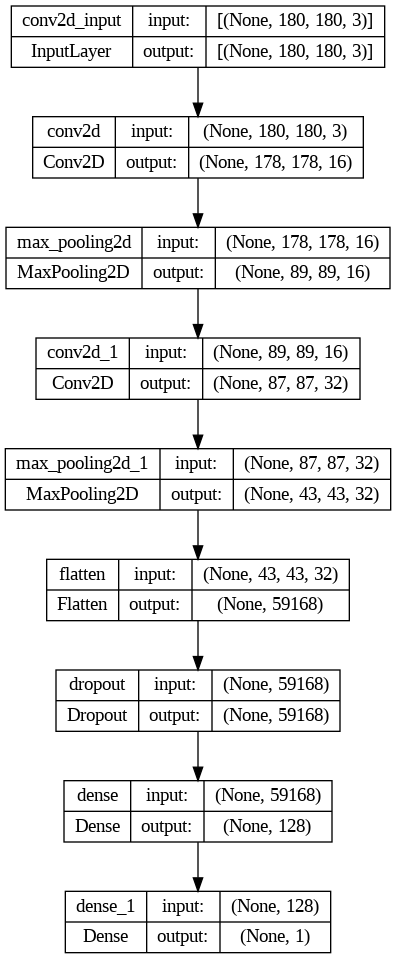

In [54]:
# Plot layers

tf.keras.utils.plot_model(model_aug, show_shapes=True)

## vii.b. Model Training

Pada bagian ini, arsitektur model yang telah di definisikan akan dilakukan pelatihan terhadap data train_set dan data val_set yang telah di augmentasi sebelumnya. Pelatihan akan dilakukan sebanyak 25 epoch.

In [55]:
# Train the model

%%time
history_aug = model_aug.fit(train_set_aug, epochs=25, validation_data=val_set_aug, batch_size=batch_size)

Epoch 1/25
20/20 [==============================] - 41s 2s/step - loss: 2.2222 - accuracy: 0.5688 - val_loss: 0.5828 - val_accuracy: 0.6625
Epoch 2/25
20/20 [==============================] - 47s 2s/step - loss: 0.5353 - accuracy: 0.7225 - val_loss: 0.5003 - val_accuracy: 0.7375
Epoch 3/25
20/20 [==============================] - 34s 2s/step - loss: 0.4249 - accuracy: 0.8229 - val_loss: 0.3709 - val_accuracy: 0.8469
Epoch 4/25
20/20 [==============================] - 40s 2s/step - loss: 0.3861 - accuracy: 0.8425 - val_loss: 0.3605 - val_accuracy: 0.8469
Epoch 5/25
20/20 [==============================] - 42s 2s/step - loss: 0.3502 - accuracy: 0.8517 - val_loss: 0.3290 - val_accuracy: 0.8667
Epoch 6/25
20/20 [==============================] - 44s 2s/step - loss: 0.3128 - accuracy: 0.8729 - val_loss: 0.2897 - val_accuracy: 0.8708
Epoch 7/25
20/20 [==============================] - 44s 2s/step - loss: 0.2926 - accuracy: 0.8763 - val_loss: 0.3317 - val_accuracy: 0.8562
Epoch 8/25
20/20 [==

Dari hasil pelatihan pada epoch 25 dapat diketahui sebagai berikut :
- Loss : 0.2128
- Accuracy : 0.9171
- Validation Loss : 0.2305
- Validation Accuracy : 0.9010

Hasil ini menunjukkan bahwa model memiliki nilai akurasi yang cukup tinggi baik di data train maupun di data validation dengan nilai mencapai sekitar 90% untuk keduanya. Nilai loss pada model ini juga tergolong cukup rendah yaitu di angka 0.23. Artinya, model dapat memprediksi dengan baik dan mendekati nilai targetnya. Model dapat mengenali pola dalam data dengan efektif.


## vii.c. Model Evaluation

Pada bagian ini akan dilakukan evaluasi pada model yang telah dibangun.

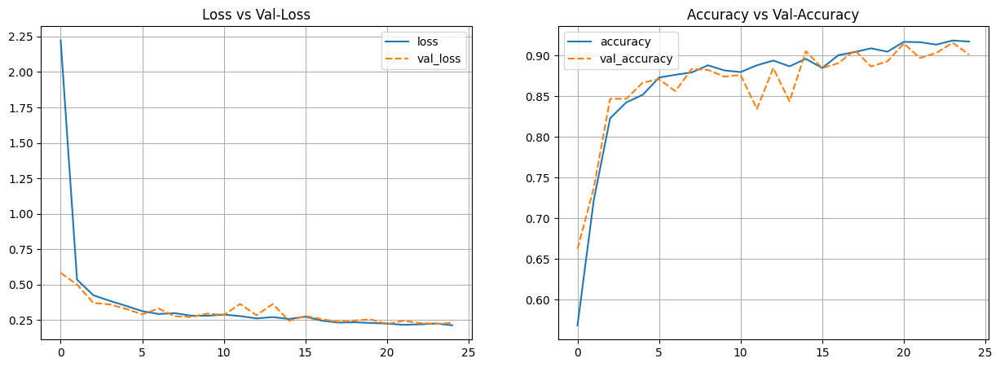

In [56]:
# Plot training results

history_aug_df = pd.DataFrame(history_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_aug_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_aug_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Berdasarkan grafik tersebut, model ini menunjukkan performa yang baik dengan interpretasi sebagai berikut:

1. **Grafik Loss vs Val-Loss** :
   - Garis loss terlihat menurun secara drastis di awal hingga pada sekitar epoch ke-2. Setelah itu, loss pada data train terus menurun secara perlahan.
   - Garis val loss tidak jauh berbeda dengan garis loss, akan tetapi garis ini cenderung sedikit berfluktuasi di sekitar epoch 10 hingga 15.
   - Nilai loss dan val_loss menuju hingga mendekati titik 0.
   - Terlihat kedua garis saling menempel terutama pada epoch terakhir yang artinya tidak ada jarak antara nilai loss dan val loss.

2. **Grafik Accuracy vs Val-Accuracy** :
   - Garis accuracy terlihat meningkat secara tajam di dua epoch awal dan kemudian mencapai kestabilan pada epoch selanjutnya.
   - Sama halnya dengan garis accuracy, val accuracy terlihat meningkat secara tajam di dua epoch awal akan tetapi terjadi fluktuasi di epoch selanjutnya hingga epoch terakhir.
   - Terlihat kedua garis cenderung saling berdekatan. Jika kita lihat pada epoch terakhir, kedua titik memiliki jarak antara nilai accuracy dan val accuracy, namun jarak ini masih tergolong sangat kecil.
      
Dapat disimpulkan bahwa model mencapai akurasi yang tinggi baik pada data train maupun data validasi, akan tetapi ada sedikit perbedaan antara akurasi train dan validasi yang mengindikasikan adanya sedikit overfitting pada model tersebut. Meskipun model ini dapat dikategorikan sebagai model yang memiliki performa cukup baik atau **Goodfit**, akan tetapi kita dapat meningkatkan performa tersebut dengan beberapa cara, diantaranya dapat menambahkan dropout, early stopping, sampai dengan menggunakan transfer learning.

# viii. ANN Improvement (Sequential API/Functional API)

Demi meningkatkan performa dari model train yang telah dibentuk, kita akan melakukan modifikasi pada arsitektur model. Dalam kasus ini, hal-hal yang menjadi bahan improvement adalah sebagai berikut :
1. **Menambahkan transfer learning VGG16**  
   Berdasarkan sumber [berikut](https://builtin.com/machine-learning/vgg16), VGG16 adalah deep Convolutional Neural Network (CNN) yang digunakan untuk tugas klasifikasi gambar. Model ini juga sangat baik dalam mendeteksi detail tekstur, bentuk, dan kontur pada objek di dalam gambar.
2. **Dimensi gambar yang lebih tinggi**  
   Dalam mengimplementasikan model VGG16, ada beberapa syarat yang diperlukan salah satunya adalah mendefinisikan dimensi gambar ke dalam ukuran 224x224.
3. **Mereduksi batch size**  
   Dapat membantu mencapai stabilitas pelatihan dan pembaruan model yang lebih baik.
4. **Menambahkan Global Average Pooling**  
   Mengurangi dimensi keluaran model yang telah dilatih sebelumnya sebelum dihubungkan ke lapisan padat. Penggunaan Global Average Pooling berdasarkan pada referensi berikut : [referensi 1](https://www.frontiersin.org/journals/computational-neuroscience/articles/10.3389/fncom.2022.1004988/full) dan [referensi 2](https://www.quora.com/Why-was-global-average-pooling-used-instead-of-a-fully-connected-layer-in-GoogLeNet-and-how-was-it-different), GAP sangat membantu dalam mengurangi data dan tidak mengandung parameter yang dapat dilatih seperti Max Pooling. GAP membantu dalam stabilisasi akurasi validasi, yang merupakan tanda overfitting. Dengan demikian, akan dihasilkan model lebih ringkas yang tidak mudah mengalami overfitting.
5. **Menambah Batch Normalization**  
   Berdasarkan referensi [berikut](https://www.pingcap.com/article/understanding-the-impact-of-batch-normalization-on-cnns/), penggunaan batch normalization dapat menstabilkan pembelajaran dan meningkatkan kecepatan konvergensi model serta meningkatkan generalisasi dan akurasi model CNN
6. **Menambah Callbacks**  
    - Early Stopping : Memantau kehilangan validasi dan menghentikan pelatihan lebih awal jika tidak membaik selama jangka waktu tertentu, sehingga diharapkan dapat membantu mencegah terjadinya overfitting.
    - ReduceLROnPlateau: Mengurangi kecepatan pembelajaran dan memungkinkan penyesuaian yang lebih baik pada pembelajaran model selama pelatihan.


## vii.a. Model Definition

In [12]:
# Define hyperparameters

img_height= 224
img_width= 224
batch_size= 64
seed= 20

In [13]:
# Download pretrained model


pretrained_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height,img_width, 3))
pretrained_model.trainable = False

58889256/58889256 [==============================] - 4s 0us/step


In [ ]:
# Create batch generator for training, validation, and test sets

train_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(   rotation_range=15,           # Rotate images between -15 and +15 degrees
                                                                      zoom_range=0.2,              # Zoom images by up to 20%
                                                                      width_shift_range=0.1,       # Shift images horizontally by up to 10% of width
                                                                      height_shift_range=0.1,      # Shift images vertically by up to 10% of height
                                                                      shear_range=0.1,             # Shear images
                                                                      horizontal_flip=True,        # Flip images horizontally
                                                                      brightness_range=[0.8, 1.2], # Adjust brightness between 80% and 120%
                                                                      fill_mode='nearest',         # Fill empty pixels after transformations
                                                                   preprocessing_function=preprocess_input) # Apply preprocessing function for the model

# Generate augmented training set
train_set_tl = train_datagen_tl.flow_from_dataframe(
                                                      dataframe=train_set,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2
                                                    )

# Generate augmented validation set
val_set_tl = train_datagen_tl.flow_from_dataframe(
                                                      dataframe=val_set,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2
                                                     )

# Create test set generator with only preprocessing, no augmentation
test_datagen_tl = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

test_set_tl = test_datagen_tl.flow_from_dataframe(
                                                      dataframe=test_set,
                                                      x_col='images',
                                                      y_col='label',
                                                      target_size=(img_height, img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=False,
                                                      seed=2
                                                   )

Found 2400 validated image filenames belonging to 2 classes.
Found 960 validated image filenames belonging to 2 classes.
Found 640 validated image filenames belonging to 2 classes.


In [15]:
# Create Sequential API model

model_tl = Sequential()
model_tl.add(pretrained_model) # Add the pretrained base model (VGG16)

# Add Global Average Pooling layer to reduce dimensions
model_tl.add(GlobalAveragePooling2D())

# Add fully connected layer with ReLU activation
model_tl.add(Dense(128, activation='relu', kernel_initializer=tf.keras.initializers.HeNormal(seed=seed)))
model_tl.add(BatchNormalization())
model_tl.add(Dropout(0.5))


# Add the output layer with sigmoid activation for binary classification
model_tl.add(Dense(1, activation='sigmoid', kernel_initializer=tf.keras.initializers.GlorotNormal()))

# Compile the model with binary crossentropy loss and Adam optimizer
model_tl.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Define callbacks to improve training
early_stopping = EarlyStopping(
    monitor='val_loss', patience=5, restore_best_weights=True, verbose=1
)

# Reduce learning rate if validation loss plateaus
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, verbose=1, min_lr=1e-6
)

# Display model architecture summary
model_tl.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 128)               65664     
                                                                 
 batch_normalization (Batch  (None, 128)               512       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 1

In [16]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

Berikut ini adalah gambaran dari arsitektur Sequential API untuk model yang telah di berikan penambahan.

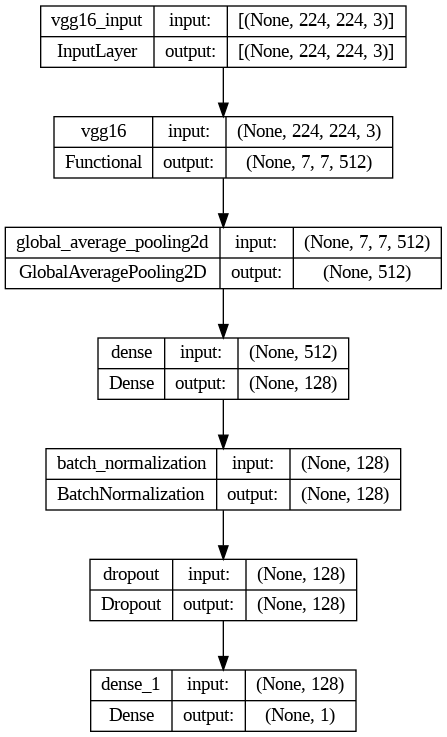

In [17]:
# Plot layers

tf.keras.utils.plot_model(model_tl, show_shapes=True)

## vii.b. Model Training

In [18]:
# Train the model

%%time
history_tl = model_tl.fit(train_set_tl,
                          epochs=25,
                          validation_data=val_set_tl,
                          batch_size=batch_size,
                          callbacks=[early_stopping, reduce_lr] # beda disini
                          )

Epoch 1/25
38/38 [==============================] - 100s 2s/step - loss: 0.1740 - accuracy: 0.9287 - val_loss: 0.0374 - val_accuracy: 0.9896 - lr: 0.0010
Epoch 2/25
38/38 [==============================] - 54s 1s/step - loss: 0.0544 - accuracy: 0.9833 - val_loss: 0.0284 - val_accuracy: 0.9906 - lr: 0.0010
Epoch 3/25
38/38 [==============================] - 59s 2s/step - loss: 0.0402 - accuracy: 0.9887 - val_loss: 0.0307 - val_accuracy: 0.9896 - lr: 0.0010
Epoch 4/25
38/38 [==============================] - 54s 1s/step - loss: 0.0405 - accuracy: 0.9862 - val_loss: 0.0340 - val_accuracy: 0.9885 - lr: 0.0010
Epoch 5/25
38/38 [==============================] - 55s 1s/step - loss: 0.0359 - accuracy: 0.9896 - val_loss: 0.0241 - val_accuracy: 0.9917 - lr: 0.0010
Epoch 6/25
38/38 [==============================] - 55s 1s/step - loss: 0.0262 - accuracy: 0.9933 - val_loss: 0.0308 - val_accuracy: 0.9906 - lr: 0.0010
Epoch 7/25
38/38 [==============================] - 53s 1s/step - loss: 0.0343 - 

Setelah 24 epoch, pelatihan dihentikan lebih awal karena kinerja model pada dataset validasi dianggap tidak ada peningkatan. Dari hasil pelatihan ini dapat diketahui sebagai berikut :
- Loss : 0.0100
- Accuracy : 0.9967
- Validation Loss : 0.0228
- Validation Accuracy : 0.9917

Hasil ini menunjukkan bahwa model yang telah diberikan penambahan metode memiliki performa yang jauh lebih baik dibandingkan dengan sebelumnya. Hal ini dapat diketahui melalui nilai loss dan val loss yang sangat kecil yaitu mendekati nilai 0. Nilai yang rendah menunjukkan bahwa model memiliki performa yang baik dalam memprediksi data pelatihan. Begitu pula dengan nilai accuracy dan val accuracy yang memiliki nilai sangat tinggi yaitu mencapi angka 99%. Dapat diartikan bahwa kemungkinan besar model memiliki kemampuan generalisasi yang baik.


## vii.c. Model Evaluation

Pada bagian ini akan dilakukan evaluasi pada model yang telah dibangun.

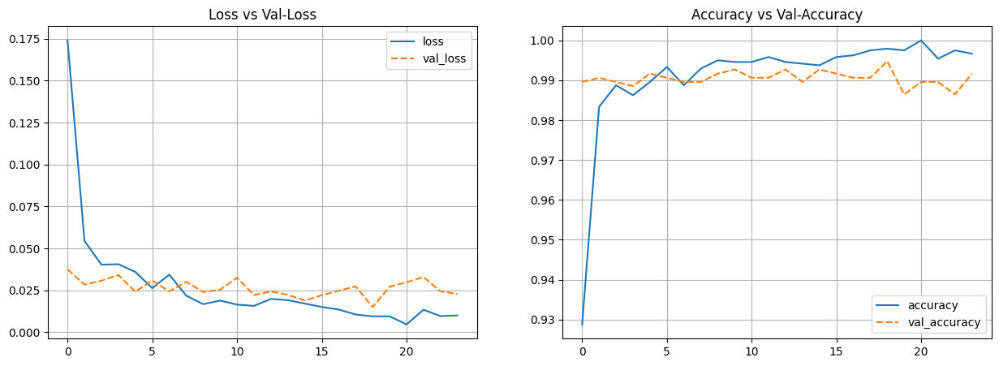

In [20]:
# Plot training results

history_tl_df = pd.DataFrame(history_tl.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_tl_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_tl_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

Setelah dilakukan improvement pada model, didapatkan hasil grafik dengan penjelasan sebagai berikut :

1. **Loss vs Validation Loss**:
   - Garis loss menunjukkan penurunan yang signifikan dari awal hingga beberapa epoch pertama kemudian mencapai stabil di posisi rendah mendekati nilai 0.
   - Meskipun adanya fluktuasi pada val loss, namun model dapat dikatakan berhasil belajar dengan baik pada data pelatihan dan mampu mempertahankan performa yang konsisten pada data validasi.

2. **Accuracy vs Validation Accuracy**:
   - Garis accuracy pada data pelatihan mengalami peningkatan yang cukup cepat hingga mencapai sekitar 99% setelah beberapa epoch pertama dan terus meningkat secara perlahan sampai mendekati 100%.
   - Sama halnya dengan garis accuracy, garis validation accuracy juga terjadi fluktuasi di setiap epoch namun konsisten pada angka 99%.

Kesimpulan :  
Jika dibandingkan denga model training sebelumnya, dengan adanya penambahan metode dalam membangun model, akan menghasilkan performa yang jauh lebih baik.


Selanjutnya kita akan melakukan evaluasi pada model yang telah dibuat terhadap data test_set.


In [21]:
# Evaluate test-set
y_pred_proba = model_tl.predict(test_set_tl)

10/10 [==============================] - 3s 281ms/step


In [22]:
# Get the probability for each class using threshold 0.5

y_pred_classes = (y_pred_proba > 0.5).astype("int32")

In [23]:
# Display prediction
print("Prediksi Probabilitas: ", y_pred_proba)


Prediksi Probabilitas:  [[1.13354786e-03]
 [9.99992728e-01]
 [1.00000000e+00]
 [9.99999642e-01]
 [7.19393211e-05]
 [2.00048376e-07]
 [1.00000000e+00]
 [7.10931927e-05]
 [1.40168459e-05]
 [1.62523687e-02]
 [9.99955893e-01]
 [1.00000000e+00]
 [1.00000000e+00]
 [9.99991059e-01]
 [9.99958873e-01]
 [1.58481850e-08]
 [9.99995351e-01]
 [9.99998212e-01]
 [9.99875665e-01]
 [4.19443334e-03]
 [9.99936581e-01]
 [9.99999881e-01]
 [9.99997735e-01]
 [9.99999404e-01]
 [1.00000000e+00]
 [9.99999881e-01]
 [5.51533559e-03]
 [1.00000000e+00]
 [1.00000000e+00]
 [9.99974012e-01]
 [9.99999881e-01]
 [1.32729090e-08]
 [1.48854800e-04]
 [4.97154717e-04]
 [1.00000000e+00]
 [9.99940872e-01]
 [9.99984026e-01]
 [2.64412336e-07]
 [1.16633624e-03]
 [9.99777853e-01]
 [1.60148318e-07]
 [9.99999046e-01]
 [9.99811471e-01]
 [9.98031914e-01]
 [3.64392712e-08]
 [9.99998212e-01]
 [9.99999642e-01]
 [1.35635268e-02]
 [4.80795788e-05]
 [4.09996375e-08]
 [1.00000000e+00]
 [2.65610236e-08]
 [9.14239436e-02]
 [9.99970555e-01]
 [3.

In [24]:
# Display class prediction
print("Kelas Prediksi: ", y_pred_classes)

Kelas Prediksi:  [[0]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [0]
 [0]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [0]
 [0]
 [0]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [0]
 [0]
 [0]
 [1]
 [0]
 [0]
 [1]
 [0]
 [1]
 [0]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [0]
 [1]
 [0]
 [1]
 [1]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [0]
 [0]
 [0]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [0]
 [0]
 [0]
 [1]
 [0]
 [0]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [1]
 [1]
 [0]
 [0]
 [1]
 [0]
 [0]
 [0]
 [1]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]
 [0]
 [1]
 [0]
 [0]
 [1]
 [1]
 [1]
 [0]
 [0]
 [0]
 [1]
 [0]
 [1]
 [0]
 [1]
 [0]
 [0]
 [1]
 [0]
 [1]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]
 [1]
 [0]
 [1]
 [1]
 [0]
 [1]
 [0]
 [0]
 [1]
 [1]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [0]
 [1]
 [1]
 [1]
 [0]
 [1]
 [1]
 [1]
 [1]
 [1]
 [0]
 [0]
 [0]
 [1]
 [1

In [25]:
# Display Classification Report
y_test = test_set_tl.classes

class_names = list(class_indices.keys())
print(classification_report(y_test, y_pred_classes, target_names=class_names))

# Total prediction
total_predictions = len(y_pred_classes)
print("Total Prediksi: ", total_predictions)

              precision    recall  f1-score   support

       bikes       0.98      0.99      0.98       320
        cars       0.99      0.97      0.98       320

    accuracy                           0.98       640
   macro avg       0.98      0.98      0.98       640
weighted avg       0.98      0.98      0.98       640

Total Prediksi:  640


Akurasi keseluruhan memiliki angka 0.98, yang berarti bahwa 98% dari total 640 prediksi yang dilakukan oleh model adalah benar. Akurasi ini dapat dikatakan sangat tinggi yang menunjukkan bahwa model mampu mengklasifikasikan gambar bikes dan cars dengan sangat baik dengan hanya sekitar 2% kesalahan.

In [26]:
class_names

['bikes', 'cars']

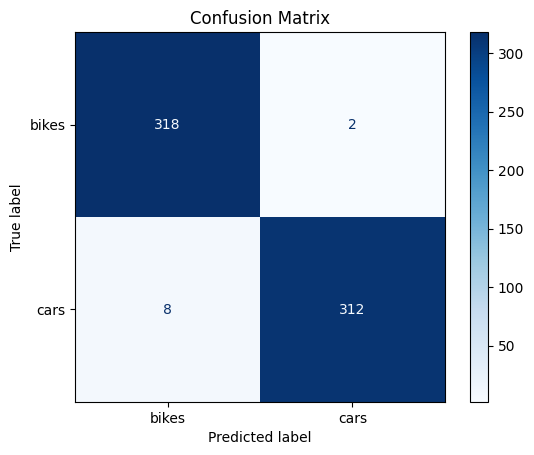

In [27]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

Dari output confusion matrix tersebut dapat diketahui :
- **True Positive** dan **True Negative** :
   - Model mampu memprediksi 318 gambar dengan benar sebagai bikes dari 320 gambar bikes.
   - Model mampu memprediksi 312 gambar dengan benar sebagai cars dari 320 gambar cars.  
- **False Positive** dan **False Negative**:
   - Terdapat 2 kesalahan pada kelas bikes yang diprediksi sebagai cars.
   - Terdapat 8 kesalahan pada kelas cars yang diprediksi sebagai bikes.

Kesimpulan :  
Model sangat efektif dalam membedakan antara bikes dan cars, dengan kesalahan yang sangat sedikit. Meskipun begitu, model ini masih memiliki kesalahan dalam mengklasifikasikan gambar yang dapat diasumsikan adanya gambar yang membingungkan model.

Selanjutnya kita akan mencari tahu gambar seperti apa yang menghasilkan kesalahan dalam prediksi.

In [28]:
# New Dataframe to show images from False Positive and False Negative
df_test_set = test_set.copy()
df_test_set['predicted_label'] = y_pred_classes
df_test_set['true_label'] = y_test

In [29]:
df_test_set

,images,label,predicted_label,true_label
2106,/content/Car-Bike-Dataset/Bike/bike_132.jpg,bikes,0,0
959,/content/Car-Bike-Dataset/Car/car_1961.jpg,cars,1,1
2371,/content/Car-Bike-Dataset/Car/car_1323.jpg,cars,1,1
69,/content/Car-Bike-Dataset/Car/car_1915.jpg,cars,1,1
359,/content/Car-Bike-Dataset/Bike/bike_793.jpg,bikes,0,0
...,...,...,...,...
1307,/content/Car-Bike-Dataset/Car/car_349.jpg,cars,1,1
3530,/content/Car-Bike-Dataset/Car/car_1720.jpg,cars,1,1
105,/content/Car-Bike-Dataset/Bike/bike_1876.jpg,bikes,0,0
2408,/content/Car-Bike-Dataset/Car/car_446.jpg,cars,1,1


In [30]:
# False Positive
false_positives = df_test_set[(df_test_set['true_label'] == 0) & (df_test_set['predicted_label'] == 1)]
fp_images = false_positives['images'].tolist()

# False Negatives
false_negatives = df_test_set[(df_test_set['true_label'] == 1) & (df_test_set['predicted_label'] == 0)]
fn_images = false_negatives['images'].tolist()

print("False Positives:", fp_images)
print("False Negatives:", fn_images)

False Positives: ['/content/Car-Bike-Dataset/Bike/bike_265.jpg', '/content/Car-Bike-Dataset/Bike/bike_215.jpg']
False Negatives: ['/content/Car-Bike-Dataset/Car/car_1734.jpg', '/content/Car-Bike-Dataset/Car/car_1643.jpg', '/content/Car-Bike-Dataset/Car/car_829.jpg', '/content/Car-Bike-Dataset/Car/car_354.jpg', '/content/Car-Bike-Dataset/Car/car_1092.jpg', '/content/Car-Bike-Dataset/Car/car_1228.jpg', '/content/Car-Bike-Dataset/Car/car_018.jpg', '/content/Car-Bike-Dataset/Car/car_1857.jpg']


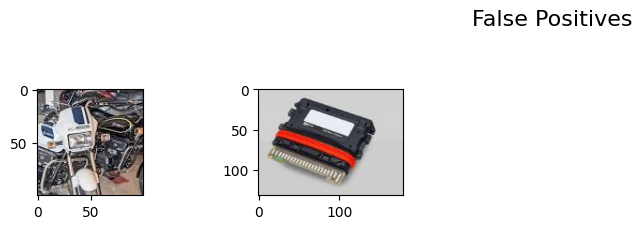

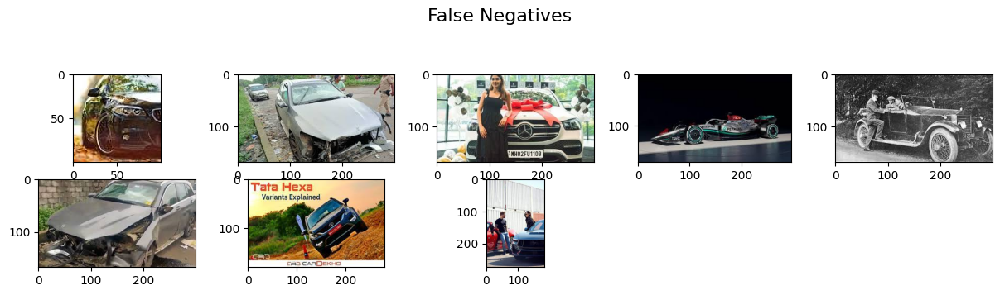

In [31]:
# Show images
def display_images(image_paths, title):
    plt.figure(figsize=(15, 8))
    plt.suptitle(title, fontsize=16)
    for i, image_path in enumerate(image_paths):
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(5, 5, i + 1)
        plt.imshow(img)
    plt.show()

# False Positives
if fp_images:
    display_images(fp_images, "False Positives")
else:
    print("No False Positives found.")

# False Negatives
if fn_images:
    display_images(fn_images, "False Negatives")
else:
    print("No False Negatives found.")

**FALSE POSITIVE** :
- Gambar 1:  
Sebuah bikes yang diprediksi sebagai car. Terlihat bahwa gambar tersebut hanyalah sebagian kecil dari keseluruhan motor. Selain itu, latar belakang dari gambar tersebut akan berpotensi membingungkan model karena secara visual kita melihat adanya bagian body dari bikes yang sehingga objek menjadi sulit untuk di deteksi.
- Gambar 2:  
Gambar ini bukan merupakan gambar dari bikes namun hanyalah suatu komponen dari kendaraan entah itu bikes atau cars. Sehingga, akan sangat wajar jika ada kesalahan dalam memprediksinya.

**FALSE NEGATIVE** :
- Gambar 1, 2, dan 6:  
Kedua gambar ini merupakan gambar mobil yang rusak atau dalam keadaan tidak utuh. Seingga, ada kemungkinan gambar ini membingungkan model karena tampilan secara visual pun tidak sesuai dengan mobil pada umumnya.
- Gambar 3:  
Gambar ini adalah gambar dimana mobil bukan sebagai objek utama melainkan sebagai latar belakang. Hal inilah yang mungkin menambah kompleksitas pada gambar dan menyebabkan kesalahan prediksi.
- Gambar 4:  
Mobil yang tertampil adalah mobil balap dengan desain yang sangat berbeda dari mobil biasa.
- Gambar 5:  
Mobil vintage pada gambar ini berbeda dalam bentuk dan gaya dari mobil modern, sehingga dapat mempersulit model untuk mengenalinya sebagai mobil.
- Gambar 7 :  
Gambar ini menunjukkan mobil dengan kemiringan tajam di medan off-road. Sudut pengambilan gambar dan kemiringan kendaraan memberikan tampilan yang tidak umum bagi mobil di data pelatihan.
- Gambar 8 :  
Adanya gambar manusia dalam gambar dapat mengganggu deteksi objek utama. Selain itu, sudut pengambilan gambar yang berbeda serta pencahayaan yang lebih gelap akan membuat model kesulitan dalam mengenali objek mobil.

# x. Model Saving

Pada bagian ini akan dilakukan penyimpanan model.

In [ ]:
model_tl.save('model_tl.h5')

# xii. Conclusion

Dari proyek yang dilakukan, didapatkan kesimpulan sebagai berikut :
- Proyek ini berhasil mengembangkan model klasifikasi gambar menggunakan pendekatan deep learning untuk membedakan antara gambar mobil (cars) dan motor (bikes)
- Model ini sangat cocok untuk digunakan dalam klasifikasi gambar dengan tingkat akurasi yang tinggi.
- Berdasarkan hasil uji, model menunjukkan performa yang sangat baik dengan akurasi tinggi mencapai 98% pada data pengujian yang mana nilai ini cukup melebihi target minimum 70% pada penetapan di awal.
- Hasil confusion matrix menunjukkan adanya sedikit kesalahan pada prediksi, di mana terjadi 2 False Positives dan 8 False Negatives.
- Kelebihan Model :  
   - Model memiliki akurasi yang sangat tinggi dalam membedakan gambar mobil dan motor serta memiliki tingkat kesalahan yang minim.
   - Dengan optimalisasi seperti early stopping dan reduce on plateau, model dapat melakukan inferensi dalam waktu lebih singkat yang memungkinkan pengolahan data dalam waktu real-time. Hal ini sangat penting untuk implementasi sistem di lapangan, seperti pengawasan lalu lintas langsung atau pelacakan kendaraan.
- Kekurangan Model :
  - Model mengalami kesalahan dalam mengklasifikasikan gambar dengan konteks tidak biasa, baik itu dari segi latar belakang, kendaraan yang tidak standar, atau adanya objek lain disekitar kendaraan. Kesalahan ini bisa mengurangi efektivitas sistem di lapangan.
- Langkah Perbaikan Model :
  - Menambah variasi data pelatihan untuk mencakup gambar kendaraan dalam berbagai situasi, seperti sudut pengambilan gambar yang beragam, tingkat kecerahan gambar yang lebih bervariasi, dan adanya objek di sekitar kendaraan.
  - Mempertimbangkan penggunaan arsitektur model yang lebih kompleks, seperti ResNet atau EfficientNet yang mungkin memiliki kemampuan generalisasi yang lebih baik dibandingkan VGG16.
  - Menggunakan augmentasi data lebih lanjut untuk membuat model lebih robust terhadap variasi dalam gambar yang mungkin ditemui dalam kondisi lapangan.
-Rekomendasi bisnis :
  - Model ini dapat diintegrasikan dalam sistem pengawasan lalu lintas untuk memantau jenis kendaraan secara otomatis. Hal ini dapat membantu otoritas lalu lintas dalam memantau pola lalu lintas. Sistem ini bisa dihubungkan dengan sistem peringatan otomatis untuk mendukung penegakan hukum lalu lintas.
  - Sistem ini dapat digunakan untuk mengatur jalur khusus bagi kendaraan tertentu, seperti jalur cepat dan jalur lambat di suatu daerah. Dengan klasifikasi yang akurat, sistem dapat membantu memastikan bahwa jalur khusus hanya digunakan oleh kendaraan yang sesuai.